In [2]:
#timings based on cpu-only AMD7600X 32GB Ram (only 16GB accessible in WSL)

from google_auth_oauthlib.flow import InstalledAppFlow
from google.auth.transport.requests import Request
import os
import pickle
import requests
from PIL import Image
from IPython.display import display
import torch
from time import perf_counter
import statistics

In [3]:
# import and set Processor and Model

from transformers import Blip2Processor, Blip2ForConditionalGeneration

processor = Blip2Processor.from_pretrained("Salesforce/blip2-opt-2.7b")
model = Blip2ForConditionalGeneration.from_pretrained("Salesforce/blip2-opt-2.7b"
                                                      , device_map='auto'
                                                      , offload_folder="offload"
                                                      , torch_dtype=torch.bfloat16
                                                     )
model = torch.compile(model)

#var to use cuda gpu if available for preprocessing
device = "cuda" if torch.cuda.is_available() else "cpu"


Loading checkpoint shards:   0%|          | 0/2 [00:00<?, ?it/s]

/home/jfa/miniforge3/envs/hf-dev-1/lib/python3.10/site-packages/torch/_utils.py:831: UserWarning: TypedStorage is deprecated. It will be removed in the future and UntypedStorage will be the only storage class. This should only matter to you if you are using storages directly.  To access UntypedStorage directly, use tensor.untyped_storage() instead of tensor.storage()
  return self.fget.__get__(instance, owner)()


In [4]:
# defined captioning function

def caption(img):
      
    t_start = perf_counter()
    
    raw_image = img.convert('RGB')
    inputs = processor(raw_image, return_tensors="pt").to(device, torch.float16)
    out = model.generate(**inputs, max_new_tokens=20)

    caption_txt = processor.decode(out[0], skip_special_tokens=True)  
    
    t_end = perf_counter()
    t_passed = t_end - t_start
    
    return [caption_txt, t_passed]

In [5]:
#set location of client secret file you got from Google Cloud Console and required API scopes

CLIENT_SECRET = 'client_secret.json'
SCOPES = ['https://www.googleapis.com/auth/photoslibrary']

In [6]:
#authenticate and authorize, save token in a .pickle

creds = None
if os.path.exists('token.pickle'):
    with open('token.pickle', 'rb') as token:
        creds = pickle.load(token)

if not creds or not creds.valid:
    if creds and creds.expired and creds.refresh_token:
        creds.refresh(Request())
    else:
        flow = InstalledAppFlow.from_client_secrets_file(
            CLIENT_SECRET, SCOPES)
        creds = flow.run_local_server(port=0)
    with open('token.pickle', 'wb') as token:
        pickle.dump(creds, token)


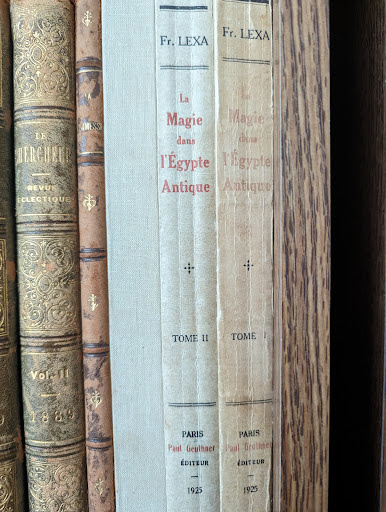

['a collection of old books on a shelf\n', 2.72700753800018]
2.72700753800018


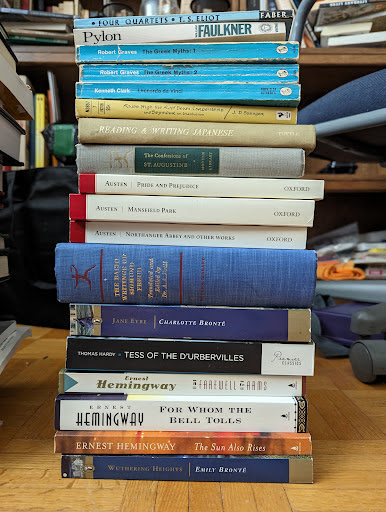

['a stack of books on a desk\n', 2.2289883799967356]
2.4779979589984578


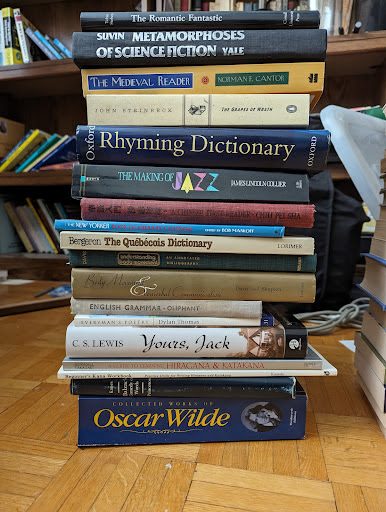

['a stack of books on a table\n', 2.1528816939971875]
2.369625870664701


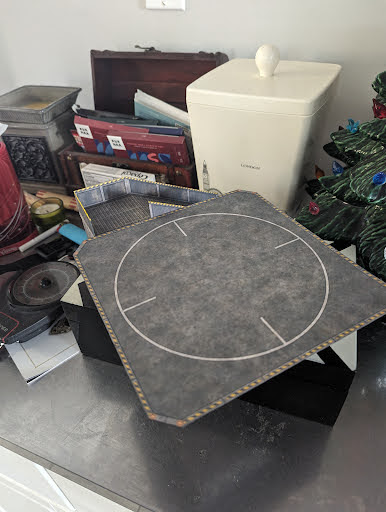

['a table with a large piece of paper on it\n', 2.816823490000388]
2.481425275498623


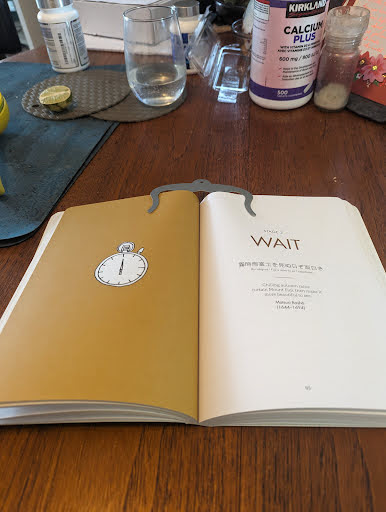

['a book with a clock on the cover sitting on a table\n', 3.0643045340038952]
2.5980011271996775


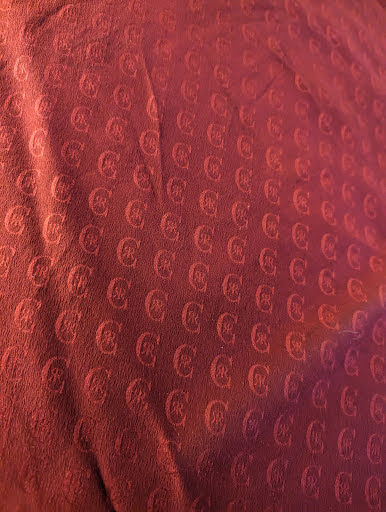

['a red blanket with a pattern on it\n', 2.3908853650063975]
2.563481833500797


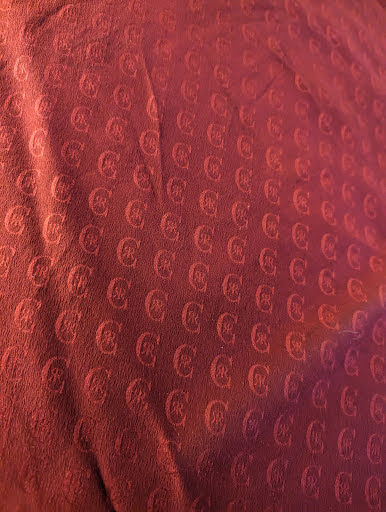

['a red blanket with a pattern on it\n', 2.378698890002852]
2.5370842701439478


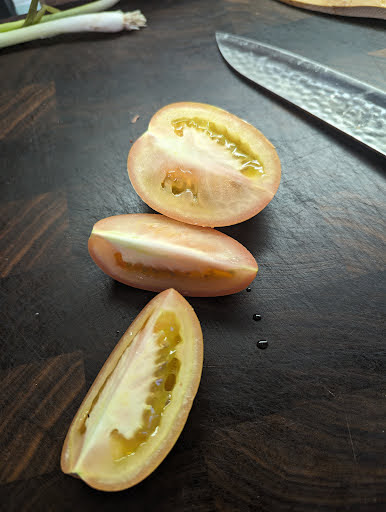

['a knife and a tomato on a cutting board\n', 2.682248144003097]
2.5552297543763416


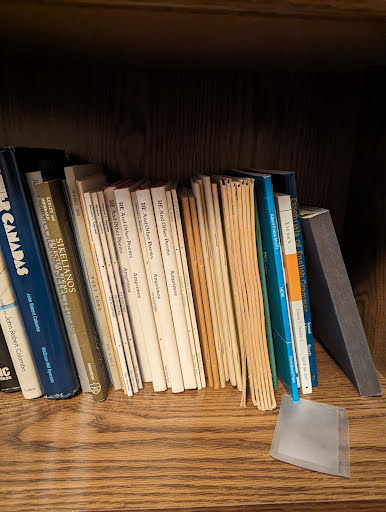

['a shelf with books on it and a small book\n', 2.7170752990059555]
2.5732125926685208


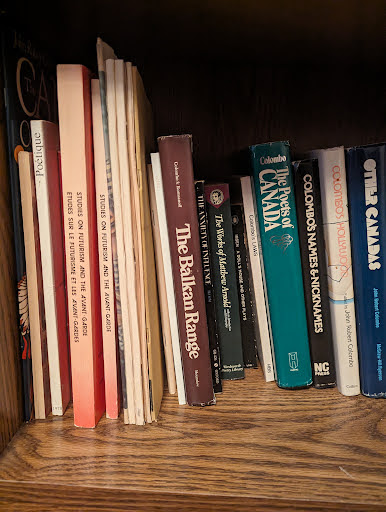

['a shelf of books on a wooden table\n', 2.4595619600004284]
2.5618475294017116


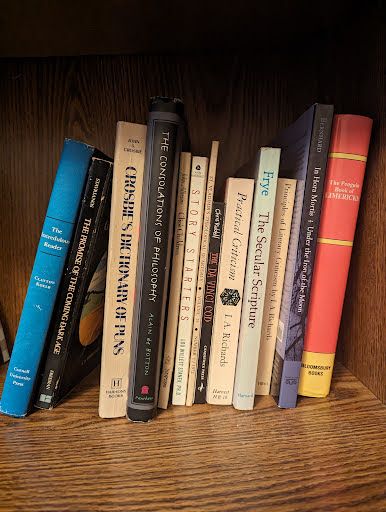

['a shelf of books on a wooden table\n', 2.3648070790004567]
2.5439347611834155


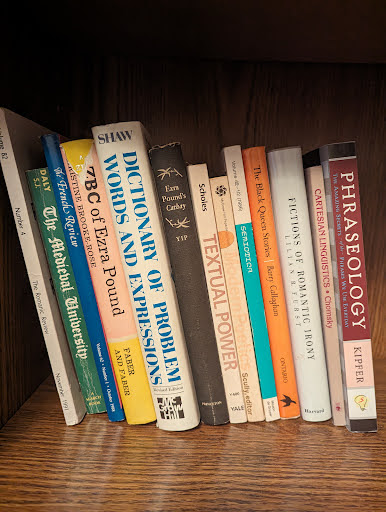

['a book shelf with a bunch of books on it\n', 2.6993064359994605]
2.5568824007514195


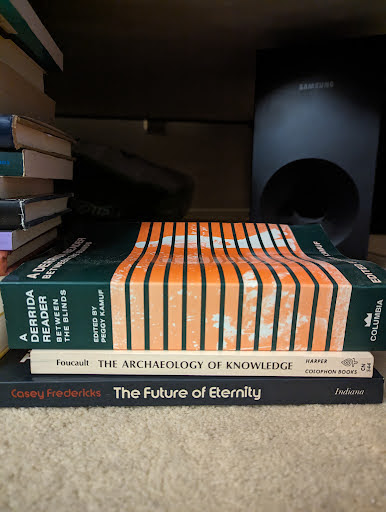

['a stack of books on a table\n', 2.151184762995399]
2.5256748901548027


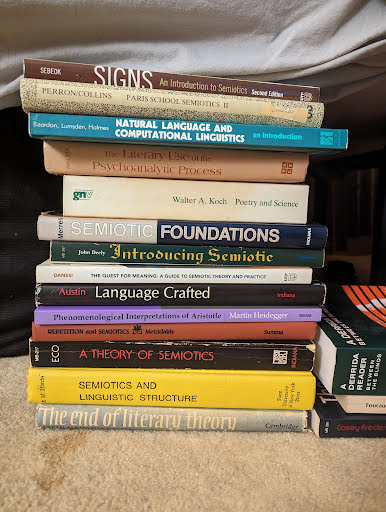

['a stack of books on a bed\n', 2.242216588994779]
2.5054278686433724


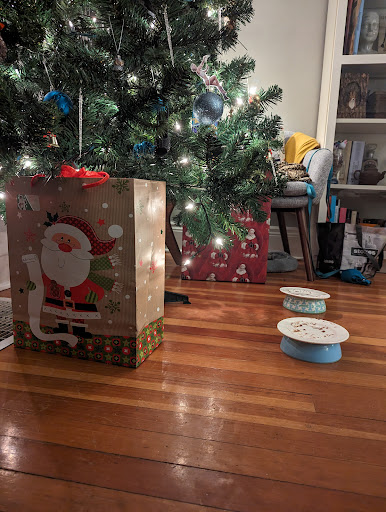

['a christmas tree with a santa clause on it\n', 2.7323982390007586]
2.520559226667198


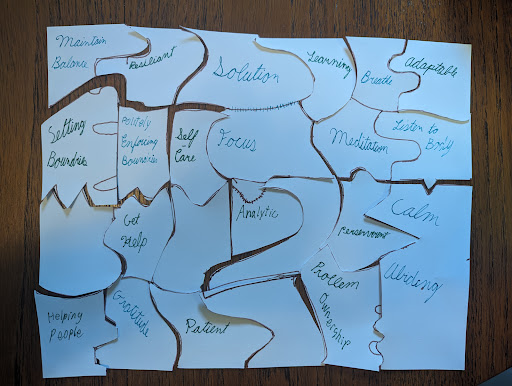

['a piece of paper with words on it\n', 2.369795544000226]
2.5111364965005123


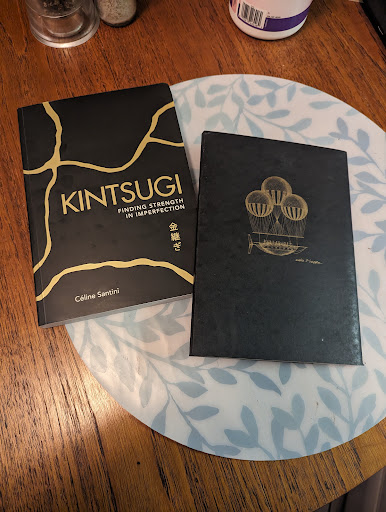

['two books on a table with a plate\n', 2.3796589379999205]
2.503402522471066


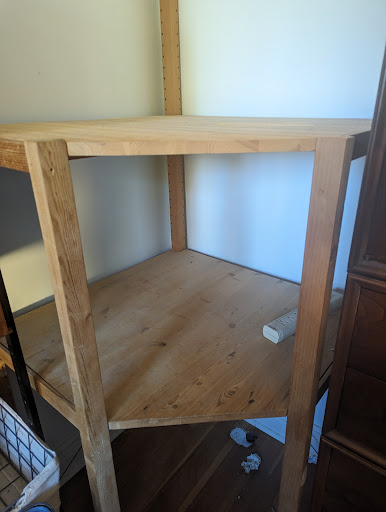

['a corner desk with a shelf and a cabinet\n', 2.336558338996838]
2.494133401166942


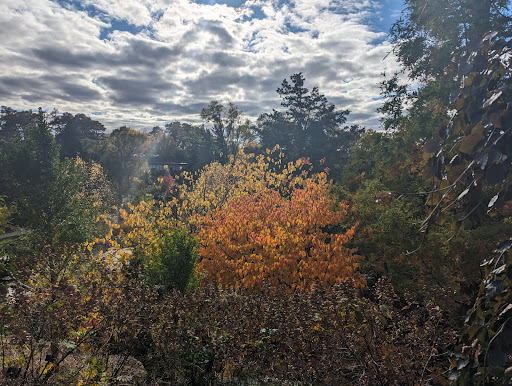

['a view of the trees in the fall\n', 2.3984953809995204]
2.4890998211581303


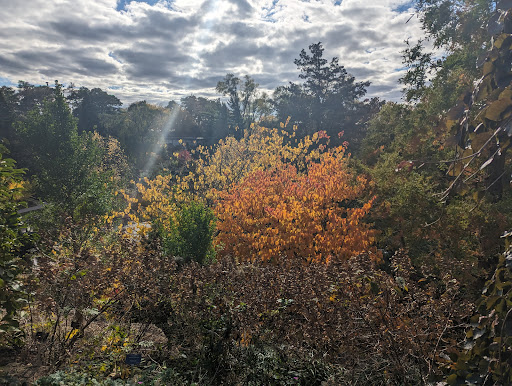

['a view of the trees and sky with the sun shining through\n', 3.0991873259990825]
2.519604196400178


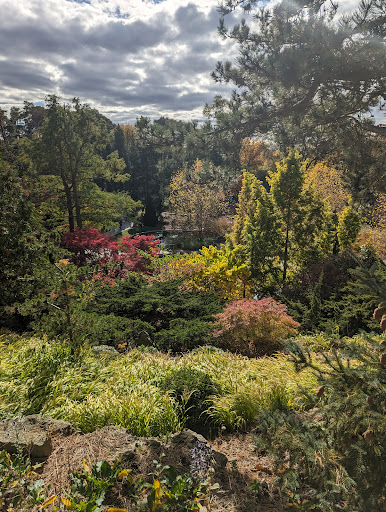

['a view of the japanese garden at the botanical gardens\n', 3.0891357350046746]
2.546724745857535


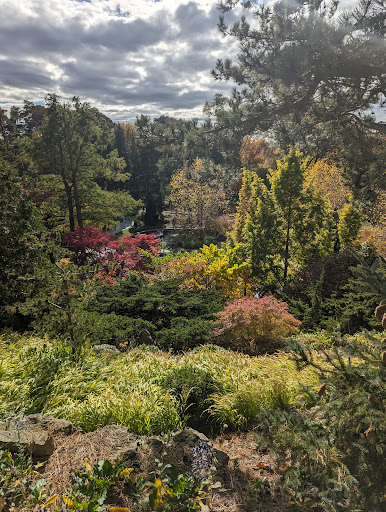

['a view of the japanese garden at the botanical gardens\n', 3.225060811993899]
2.577558203409188


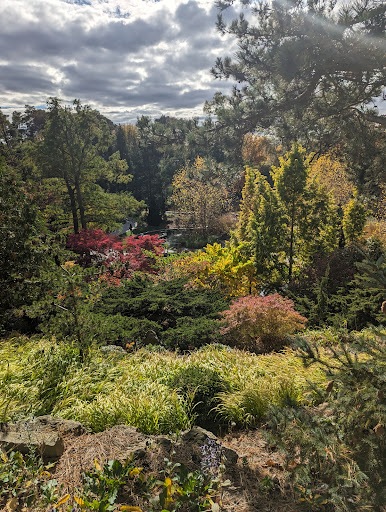

['a view of the japanese garden at the botanical gardens\n', 3.1987086119988817]
2.6045647429130874


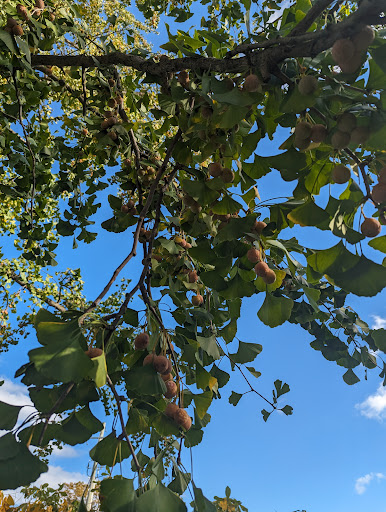

['a tree with fruit hanging from it\n', 2.2037533890033956]
2.587864269833517


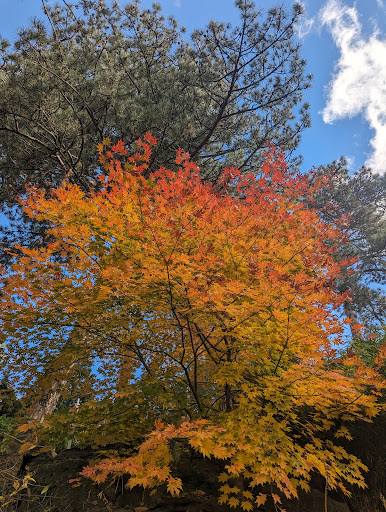

['a tree with orange leaves and a blue sky\n', 2.5369800350017613]
2.5858289004402466


In [7]:
#get all media item info

response = requests.get('https://photoslibrary.googleapis.com/v1/mediaItems', headers={'Authorization': f'Bearer {creds.token}'})
mediaItems = response.json()['mediaItems']

#loop through all the media items to get each base url and feed it to the captioning model function

baseUrls = []
times = []


for i in mediaItems:
    # baseUrls.append(i['baseUrl'])
    img = Image.open(requests.get(i['baseUrl'], stream=True).raw)
    display(img)
    caption_list = caption(img)
    print(caption_list)
    times.append(caption_list[1])
    print(statistics.fmean(times))
    avg = statistics.fmean(times)

In [8]:
print(avg)

2.5858289004402466
